# Immoweb data analysis 

In [24]:
import pandas as pd
import os
import numpy as np 
from datetime import datetime
import re
import shutil # Import shutil module for file operations
import plotly.graph_objects as go
import plotly.io as pio
import plotly.express as px
import matplotlib.pyplot as plt
from scipy.stats import pointbiserialr




### Importing row data from csv and creating clean data using Pandas

In [25]:
# Define the path to the raw dataset
raw_data_path = 'data/raw/raw_properties_20240313.csv'  

# Define the path to the clean dataset folder
clean_data_folder = 'data/cleaned/'

# Ensure the cleaned data folder exists
if not os.path.exists(clean_data_folder):
    os.makedirs(clean_data_folder)

# Current timestamp
timestamp = datetime.now().strftime("%Y%m%d-%H%M%S")

# Full path to the new file with timestamp
clean_data_path = os.path.join(clean_data_folder, f'raw_data_20240313_cleaned_{timestamp}.csv')

# Define the final clean data file path
final_clean_data = 'final_clean/data_20240313_cleaned_20240313.csv'

# Define the function for loading the dataset
def load_dataset(file_path):
    # Load dataset into DataFrame
    df = pd.read_csv(file_path, encoding='latin-1')  
    return df

### Cleaning up all the data

In [26]:
def clean_dataset(df):
    # Replace empty strings and strings that only contain whitespace with NaN for all columns
    df.replace(r'^\s*$', np.nan, regex=True, inplace=True)

    # Correct the column name if there is a semicolon or unexpected character
    df.columns = df.columns.str.replace(r'[;]+$', '', regex=True)

    # Calculate the number of duplicate rows before dropping them
    duplicate_rows = df.duplicated().sum()

    # Remove duplicate rows
    df = df.drop_duplicates()

    # Drop rows with any missing values in specific columns (if these columns must not have missing values)
    cols_with_missing_values = ['id', 'locality', 'zip_code', 'price']
    df = df.dropna(subset=cols_with_missing_values)

    # Debugging: Check data types before conversion
    print("Data property_property_property_property_property_property_property_property_property_property_property_property_types before conversion:\n", df.dtypes)

    # Convert all columns with float type that have whole numbers to Int64
    for col in df.select_dtypes(include=['float']).columns:
        # Create a mask for all non-NaN entries that have only one digit after the decimal point, which is '0'
        mask = df[col].notna() & (df[col] % 1 == 0)
        # Apply the mask and convert to Int64
        df.loc[mask, col] = df.loc[mask, col].astype('Int64')

        # Remove '.0' suffix from numbers in all numeric columns
        if df[col].dtype == 'float64':
            df[col] = df[col].apply(lambda x: re.sub(r'\.0$', '', str(x)) if pd.notnull(x) else x)

    # Debugging: Check data types after conversion
    print("Data types after conversion:\n", df.dtypes)

    # Convert boolean columns to 0 and 1
    boolean_columns = [col for col in df.columns if df[col].dtype == bool]
    for col in boolean_columns:
        df[col] = df[col].astype(int)

    # Remove leading and trailing spaces from string columns
    df = df.applymap(lambda x: x.strip() if isinstance(x, str) else x)

    # Replace empty strings resulted from stripping with NaN for string columns
    string_columns = df.select_dtypes(include=['object']).columns
    df[string_columns] = df[string_columns].replace(r'^\s*$', np.nan, regex=True)

    # Check each column and replace empty values with NaN
    for col in df.columns:
        # If column is numeric, replace non-existent values with NaN
        if df[col].dtype == 'float64' or df[col].dtype == 'int64':
            df[col] = df[col].replace(0, np.nan)
        # If column is not numeric (and hence is categorical), replace empty strings with NaN
        else:
            df[col] = df[col].replace('', np.nan)

    return df, duplicate_rows  # Return the DataFrame and the number of duplicate rows

### Print statements 

In [27]:
# Load the raw dataset
df_raw = load_dataset(raw_data_path)

# Clean the dataset, Unpack the returned DataFrame and duplicate row count
df_cleaned, duplicate_rows = clean_dataset(df_raw)  

# Save the cleaned dataset with a timestamp to create a new file each run
df_cleaned.to_csv(clean_data_path, index=False, na_rep='nan')

# Debugging: Print a sample of the DataFrame after conversion
print("Sample data after conversion:\n", df_cleaned.head())

# Output the path to confirm where the cleaned CSV has been saved
print(f"Cleaned data saved to: {clean_data_path}")

# Print a summary of NaN counts per column right after cleaning
print(df_cleaned.isna().sum())

# Print the number of duplicate rows
print(f"Duplicate rows: {duplicate_rows}")

# Copy the latest cleaned dataset to the final clean data file path
shutil.copy(clean_data_path, final_clean_data)


Data property_property_property_property_property_property_property_property_property_property_property_property_types before conversion:
 id                                  int64
price                             float64
property_type                      object
subproperty_type                   object
region                             object
province                           object
locality                           object
zip_code                            int64
latitude                          float64
longitude                         float64
construction_year                 float64
total_area_sqm                    float64
surface_land_sqm                  float64
nbr_frontages                     float64
nbr_bedrooms                      float64
equipped_kitchen                   object
fl_furnished                        int64
fl_open_fire                        int64
fl_terrace                          int64
terrace_sqm                       float64
fl_garden            

C:\Users\daryc\AppData\Local\Temp\ipykernel_29352\1536693117.py:41: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.



Sample data after conversion:
            id   price property_type subproperty_type            region  \
0  34221000.0  225000     APARTMENT        APARTMENT          Flanders   
1   2104000.0  449000         HOUSE            HOUSE          Flanders   
2  34036000.0  335000     APARTMENT        APARTMENT  Brussels-Capital   
3  58496000.0  501000         HOUSE            HOUSE          Flanders   
4  48727000.0  982700     APARTMENT           DUPLEX          Wallonia   

          province  locality  zip_code    latitude  longitude  ... fl_garden  \
0          Antwerp   Antwerp      2050  51.2171725  4.3799821  ...       NaN   
1    East Flanders      Gent      9185   51.174944   3.845248  ...       NaN   
2         Brussels  Brussels      1070  50.8420431  4.3345427  ...       NaN   
3          Antwerp  Turnhout      2275  51.2383125  4.8171921  ...       NaN   
4  Walloon Brabant  Nivelles      1410         NaN        NaN  ...       1.0   

  garden_sqm fl_swimming_pool fl_floodzone 

'final_clean/data_20240313_cleaned_20240313.csv'

### How many observations and features do you have?

In [28]:
# Calculate the number of observations (rows) and features (columns) for houses
num_observations_house = df_cleaned[df_cleaned['property_type'] == 'HOUSE'].shape[0]
num_features_house = df_cleaned[df_cleaned['property_type'] == 'HOUSE'].shape[1]

# Calculate the number of observations (rows) and features (columns) for apartments
num_observations_apartment = df_cleaned[df_cleaned['property_type'] == 'APARTMENT'].shape[0]
num_features_apartment = df_cleaned[df_cleaned['property_type'] == 'APARTMENT'].shape[1]

# Calculate the total number of observations (rows) and features (columns)
num_observations_total = df_cleaned.shape[0]
num_features_total = df_cleaned.shape[1]

# Calculate the percentages
percent_house = (num_observations_house / num_observations_total) * 100
percent_apartment = (num_observations_apartment / num_observations_total) * 100

# Print the total number of observations and features
print("\nTotal:")
print(f"Number of observations: {num_observations_total}")
print(f"Number of features: {num_features_total}")

# Print the number of observations and features for houses
print(f"Number of HOUSE observations: {num_observations_house} ({percent_house:.1f}%)")

# Print the number of observations and features for apartments
print(f"Number of APARTMENTS observations: {num_observations_apartment} ({percent_apartment:.1f}%)")




Total:
Number of observations: 75511
Number of features: 30
Number of HOUSE observations: 39255 (52.0%)
Number of APARTMENTS observations: 36256 (48.0%)


### What is the proportion of missing values per column?

In [29]:
# Calculate the proportion of missing values per column
missing_proportion = df_cleaned.isna().mean() * 100

# Create a DataFrame to hold the missing proportion information
missing_info_df = pd.DataFrame({
    'Total Missing': missing_proportion.round(1),
    'Missing for HOUSE': df_cleaned[df_cleaned['property_type'] == 'HOUSE'].isna().mean().round(1) * 100,
    'Missing for APARTMENT': df_cleaned[df_cleaned['property_type'] == 'APARTMENT'].isna().mean().round(1) * 100
})

# Convert the DataFrame to a string without wrapping
missing_info_str = missing_info_df.to_string(line_width=1000)

# Print the missing proportion information
print("Missing Proportion Information (rounded to 1 decimal place):")
print(missing_info_str)


Missing Proportion Information (rounded to 1 decimal place):
                                Total Missing  Missing for HOUSE  Missing for APARTMENT
id                                        0.0                0.0                    0.0
price                                     0.0                0.0                    0.0
property_type                             0.0                0.0                    0.0
subproperty_type                          0.0                0.0                    0.0
region                                    0.0                0.0                    0.0
province                                  0.0                0.0                    0.0
locality                                  0.0                0.0                    0.0
zip_code                                  0.0                0.0                    0.0
latitude                                 18.7               20.0                   20.0
longitude                                18.7              

### Which variables would you delete and why?

Variable that is 100% missing for an Apartment or House like isNewRealEstateProject or hasGasWaterElectricityConnection for Apartments 

### What variables are most subject to outliers?

In [30]:
# Load the final clean dataset
final_clean_data = 'final_clean/row_data_20240304_clean.csv'
df_cleaned = pd.read_csv(final_clean_data)

def plot_variable(df, column):
    # Sort values from small to big
    df_sorted = df.sort_values(by=column)
    
    # Apply filters for specific columns
    if column == 'price':
        df_sorted = df_sorted[df_sorted[column] <= 500000000]  # Limit price_main to max 500k
    elif column == 'total_area_sqm':
        df_sorted = df_sorted[df_sorted[column] <= 300]  # Limit surface to max 300m²
    elif column == 'cadastral_income':
        df_sorted = df_sorted[df_sorted[column] <= 2000]  # Limit cadastral_income to max 2000
    
    # Adjusting the plot according to the property_type
    if column == 'surface_land_sqm':
        df_houses = df_sorted[df_sorted['property_type'] == 'HOUSE']
        fig = px.histogram(df_houses, x=column, title=f'{column} Distribution for HOUSES',
                           labels={'property_type': 'Property Type', column: 'Value'},
                           color_discrete_map={'HOUSE': 'Blue'})
    else:
        fig = px.histogram(df_sorted, x=column, color='property_type', title=f'{column} Distribution', 
                           labels={'property_type': 'Property Type', column: 'Value'},
                           barmode='group',
                           color_discrete_map={'HOUSE': 'Blue', 'APARTMENT': 'Green'})
    
    # Display the plot in the notebook
    fig.show()

# Define the columns you want to plot
columns_to_plot = ['region', 'province', 'price', 'total_area_sqm', 'cadastral_income', 'epc', 'fl_swimming_pool',
                   'total_area_sqm', 'surface_land_sqm']

# Loop through each column and plot its distribution
for column in columns_to_plot:
    plot_variable(df_cleaned, column)


### How many qualitative and quantitative variables are there? How would you transform the qualitative values into numerical values?

In [31]:
# Load the final clean dataset
final_clean_data = 'final_clean/row_data_20240304_clean.csv'
df_cleaned = pd.read_csv(final_clean_data)

# Get the data types of each column
data_types = df_cleaned.dtypes

# Count the number of qualitative and quantitative variables
num_categorical = sum(data_types == 'object')
num_numeric = sum(data_types != 'object')

print("Number of qualitative variables:", num_categorical)
print("Number of quantitative variables:", num_numeric)


Number of qualitative variables: 9
Number of quantitative variables: 21


### What is the correlation between the variables and the price? Why do you think some variables are more correlated than others?

In [36]:
# Apply ordinal encoding for EPC
epc_mapping = {
    'A++': 1,
    'A+': 2,
    'A': 3,
    'B': 4,
    'C': 5,
    'D': 6,
    'E': 7,
    'F': 8,
    'G': 9,
    'MISSING': -1  # Handle missing data as -1 or any other suitable value
}
df_cleaned['epc_encoded'] = df_cleaned['epc'].map(epc_mapping)

# Apply one-hot encoding for specified categorical variables
categorical_columns = ['heating_type', 'state_building', 'subproperty_type', 'region', 'province', 'locality']
df_encoded = pd.get_dummies(df_cleaned, columns=categorical_columns)

# Filter the DataFrame into houses and apartments with postal code between 9000 and 9052
houses_df_encoded = df_encoded[(df_encoded['property_type'] == 'HOUSE')]
apartments_df_encoded = df_encoded[(df_encoded['property_type'] == 'APARTMENT')]

# Select only numeric columns for correlation analysis, now including the encoded columns
numeric_and_encoded_columns = df_encoded.select_dtypes(include=['float64', 'int64', 'uint8']).columns
numeric_and_encoded_columns = numeric_and_encoded_columns.drop(['id'])  # Exclude 'id' 

# Function to calculate correlation, print it, and plot
def plot_correlation(data, property_type):
    # Calculate the correlation matrix using numeric and encoded columns
    correlation_matrix = data[numeric_and_encoded_columns].corr()
    
    # Extract the correlation of each variable with the price, excluding 'price' itself
    price_correlation = correlation_matrix['price'].drop('price')
    
    # Sort the correlations in descending order
    sorted_correlation = price_correlation.abs().sort_values(ascending=False)
    
    # Print the sorted correlations
    print(f"Correlation with price for {property_type}:")
    print(sorted_correlation.to_string(), "\n")  # Pretty print the correlations
    
    # Plot the bar chart
    fig = go.Figure(go.Bar(
        x=sorted_correlation.index,
        y=sorted_correlation.values,
        marker_color='Blue' if property_type == 'Houses' else 'Green'
    ))

    fig.update_layout(
        title=f"Correlation between variables and the price for {property_type}",
        xaxis_title="Variables",
        yaxis_title="Correlation with Price"
    )
    
    # Show the plot in the notebook
    fig.show()

# Plot correlation for houses
plot_correlation(houses_df_encoded, 'Houses')

# Plot correlation for apartments
plot_correlation(apartments_df_encoded, 'Apartments')


Correlation with price for Houses:
total_area_sqm                    0.353655
nbr_bedrooms                      0.341815
latitude                          0.177225
nbr_frontages                     0.165206
surface_land_sqm                  0.149360
epc_encoded                       0.111621
zip_code                          0.110553
garden_sqm                        0.099970
terrace_sqm                       0.096294
longitude                         0.073039
construction_year                 0.026577
primary_energy_consumption_sqm    0.002795
cadastral_income                  0.002317
fl_furnished                           NaN
fl_open_fire                           NaN
fl_terrace                             NaN
fl_garden                              NaN
fl_swimming_pool                       NaN
fl_floodzone                           NaN
fl_double_glazing                      NaN 



Correlation with price for Apartments:
nbr_bedrooms                      0.347436
latitude                          0.205704
longitude                         0.157649
terrace_sqm                       0.153044
epc_encoded                       0.070583
cadastral_income                  0.059499
total_area_sqm                    0.048403
zip_code                          0.048184
primary_energy_consumption_sqm    0.033570
construction_year                 0.031637
nbr_frontages                     0.021649
garden_sqm                        0.004069
surface_land_sqm                       NaN
fl_furnished                           NaN
fl_open_fire                           NaN
fl_terrace                             NaN
fl_garden                              NaN
fl_swimming_pool                       NaN
fl_floodzone                           NaN
fl_double_glazing                      NaN 



**Conclusion Price/variables correlation:**
For apartments is bedroom and terrace surface important. Latitude/Longitude shown that location is also important. 
For houses is surface, bedrooms, garden, terrace more important. 

### What is the correlation between the variables and the price for Gent 9000-9052? 

In [33]:
# Apply ordinal encoding for EPC
epc_mapping = {
    'A++': 1,
    'A+': 2,
    'A': 3,
    'B': 4,
    'C': 5,
    'D': 6,
    'E': 7,
    'F': 8,
    'G': 9,
    'MISSING': -1  # Handle missing data as -1 or any other suitable value
}
df_cleaned['epc_encoded'] = df_cleaned['epc'].map(epc_mapping)

# Apply one-hot encoding for specified categorical variables
categorical_columns = ['heating_type', 'state_building', 'subproperty_type', 'region', 'province', 'locality']
df_encoded = pd.get_dummies(df_cleaned, columns=categorical_columns)

# Filter the DataFrame into houses and apartments with postal code between 9000 and 9052
houses_df_encoded = df_encoded[(df_encoded['property_type'] == 'HOUSE') & (df_encoded['zip_code'].between(9000, 9052))]
apartments_df_encoded = df_encoded[(df_encoded['property_type'] == 'APARTMENT') & (df_encoded['zip_code'].between(9000, 9052))]

# Select only numeric columns for correlation analysis, now including the encoded columns
numeric_and_encoded_columns = df_encoded.select_dtypes(include=['float64', 'int64', 'uint8']).columns
numeric_and_encoded_columns = numeric_and_encoded_columns.drop(['id', 'zip_code'])  # Exclude 'id' and 'zip_code'

# Function to calculate correlation, print it, and plot
def plot_correlation(data, property_type):
    # Calculate the correlation matrix using numeric and encoded columns
    correlation_matrix = data[numeric_and_encoded_columns].corr()
    
    # Extract the correlation of each variable with the price, excluding 'price' itself
    price_correlation = correlation_matrix['price'].drop('price')
    
    # Sort the correlations in descending order
    sorted_correlation = price_correlation.abs().sort_values(ascending=False)
    
    # Print the sorted correlations
    print(f"Correlation with price for {property_type}:")
    print(sorted_correlation.to_string(), "\n")  # Pretty print the correlations
    
    # Plot the bar chart
    fig = go.Figure(go.Bar(
        x=sorted_correlation.index,
        y=sorted_correlation.values,
        marker_color='Blue' if property_type == 'Houses' else 'Green'
    ))

    fig.update_layout(
        title=f"Correlation between variables and the price for {property_type} in the specified zip code range",
        xaxis_title="Variables",
        yaxis_title="Correlation with Price"
    )
    
    # Show the plot in the notebook
    fig.show()

# Plot correlation for houses
plot_correlation(houses_df_encoded, 'Houses')

# Plot correlation for apartments
plot_correlation(apartments_df_encoded, 'Apartments')


Correlation with price for Houses:
total_area_sqm                    0.353655
nbr_bedrooms                      0.341815
latitude                          0.177225
nbr_frontages                     0.165206
surface_land_sqm                  0.149360
epc_encoded                       0.111621
zip_code                          0.110553
garden_sqm                        0.099970
terrace_sqm                       0.096294
longitude                         0.073039
construction_year                 0.026577
primary_energy_consumption_sqm    0.002795
cadastral_income                  0.002317
fl_furnished                           NaN
fl_open_fire                           NaN
fl_terrace                             NaN
fl_garden                              NaN
fl_swimming_pool                       NaN
fl_floodzone                           NaN
fl_double_glazing                      NaN 



Correlation with price for Apartments:
nbr_bedrooms                      0.347436
latitude                          0.205704
longitude                         0.157649
terrace_sqm                       0.153044
epc_encoded                       0.070583
cadastral_income                  0.059499
total_area_sqm                    0.048403
zip_code                          0.048184
primary_energy_consumption_sqm    0.033570
construction_year                 0.031637
nbr_frontages                     0.021649
garden_sqm                        0.004069
surface_land_sqm                       NaN
fl_furnished                           NaN
fl_open_fire                           NaN
fl_terrace                             NaN
fl_garden                              NaN
fl_swimming_pool                       NaN
fl_floodzone                           NaN
fl_double_glazing                      NaN 



In [34]:
def plot_and_print_correlation_extended(data, property_type, categorical_columns):
    # One-hot encode categorical variables
    data_encoded = pd.get_dummies(data, columns=categorical_columns)
    
    # Select only numeric columns, including one-hot encoded columns, for correlation analysis
    numeric_and_encoded_columns = data_encoded.select_dtypes(include=['float64', 'int64', 'uint8']).columns
    
    # Exclude 'id' from the columns
    if 'id' in numeric_and_encoded_columns:
        numeric_and_encoded_columns = numeric_and_encoded_columns.drop('id')

    # Calculate the correlation matrix
    correlation_matrix = data_encoded[numeric_and_encoded_columns].corr()
    
    # Extract the correlation of each variable with the price, excluding 'price' itself
    price_correlation = correlation_matrix['price'].drop('price')
    
    # Sort the correlations in descending order
    sorted_correlation = price_correlation.abs().sort_values(ascending=False)
    
    # Print the sorted correlations
    print(f"Correlation with price for {property_type}:")
    for column in sorted_correlation.index:
        print(f"{column}: {sorted_correlation[column]:.4f}")
    print("\n")
    
    # Filter for displaying the top N correlations for better visualization
    top_n = 20
    sorted_correlation = sorted_correlation.head(top_n)
    
    # Plot the bar chart
    fig = go.Figure(go.Bar(
        x=sorted_correlation.index,
        y=sorted_correlation.values,
        marker_color='Blue' if property_type == 'Houses' else 'Green'
    ))

    fig.update_layout(
        title=f"Top {top_n} Correlations with Price for {property_type}",
        xaxis_title="Variables",
        yaxis_title="Correlation with Price",
        xaxis={'categoryorder':'total descending'}
    )
    
    # Show the plot
    fig.show()

# Example usage, assuming 'houses_df' and 'apartments_df' are already defined
plot_and_print_correlation_extended(houses_df, 'Houses', categorical_columns)
plot_and_print_correlation_extended(apartments_df, 'Apartments', categorical_columns)


NameError: name 'houses_df' is not defined

In [ ]:
# Filter the DataFrame into houses and apartments with postal code between 2000 and 2060
houses_df = df_cleaned[(df_cleaned['property_type'] == 'HOUSE') & (df_cleaned['zip_code'].between(2000, 2060))]
apartments_df = df_cleaned[(df_cleaned['property_type'] == 'APARTMENT') & (df_cleaned['zip_code'].between(2000, 2060))]

# Select only numeric columns for correlation analysis
numeric_columns = df_cleaned.select_dtypes(include=['float64', 'int64']).columns

# Exclude variables from the numeric columns
numeric_columns = numeric_columns.drop(['id', 'zip_code'])

# Function to calculate correlation and plot
def plot_correlation(data, property_type):
    # Calculate the correlation matrix
    correlation_matrix = data[numeric_columns].corr()
    
    # Extract the correlation of each variable with the price
    price_correlation = correlation_matrix['price'].drop('price')
    
    # Sort the correlations in descending order
    sorted_correlation = price_correlation.abs().sort_values(ascending=False)
    
    # Plot the bar chart
    fig = go.Figure(go.Bar(
        x=sorted_correlation.index,
        y=sorted_correlation.values,
        marker_color='Blue' if property_type == 'Houses' else 'Green'
    ))

    fig.update_layout(
        title=f"Correlation between variables and the price for {property_type} of Antwerp",
        xaxis_title="Variables",
        yaxis_title="Correlation with Price"
    )
    
    # Show the plot in the notebook
    fig.show()

# Plot correlation for houses
plot_correlation(houses_df, 'Houses')

# Plot correlation for apartments
plot_correlation(apartments_df, 'Apartments')


In [ ]:
import pandas as pd
import plotly.graph_objects as go

# Filter the DataFrame into houses and apartments with postal code between 1000 and 1299
houses_df = df_cleaned[(df_cleaned['property_type'] == 'HOUSE') & (df_cleaned['zip_code'].between(1000, 1299))]
apartments_df = df_cleaned[(df_cleaned['property_type'] == 'APARTMENT') & (df_cleaned['zip_code'].between(1000, 1299))]

# Select only numeric columns for correlation analysis
numeric_columns = df_cleaned.select_dtypes(include=['float64', 'int64']).columns

# Exclude 'id' from the numeric columns
numeric_columns = numeric_columns.drop('id')

# Function to calculate correlation and plot
def plot_correlation(data, property_type):
    # Calculate the correlation matrix
    correlation_matrix = data[numeric_columns].corr()
    
    # Extract the correlation of each variable with the price
    price_correlation = correlation_matrix['price'].drop('price')
    
    # Sort the correlations in descending order
    sorted_correlation = price_correlation.abs().sort_values(ascending=False)
    
    # Plot the bar chart
    fig = go.Figure(go.Bar(
        x=sorted_correlation.index,
        y=sorted_correlation.values,
        marker_color='Blue' if property_type == 'Houses' else 'Green'
    ))

    fig.update_layout(
        title=f"Correlation between variables and the price for {property_type} of Brussels",
        xaxis_title="Variables",
        yaxis_title="Correlation with Price"
    )
    
    # Show the plot in the notebook
    fig.show()

# Plot correlation for houses
plot_correlation(houses_df, 'Houses')

# Plot correlation for apartments
plot_correlation(apartments_df, 'Apartments')


### How are the variables themselves correlated to each other? Can you find groups of variables that are correlated together?

In [ ]:
# Filter the DataFrame into houses and apartments
houses_df = df_cleaned[df_cleaned['type'] == 'HOUSE']
apartments_df = df_cleaned[df_cleaned['type'] == 'APARTMENT']

# Exclude 'id' and 'price_main' columns
numeric_columns_houses = houses_df.select_dtypes(include=['float64', 'int64']).drop(columns=['id', 'price_main'])
numeric_columns_apartments = apartments_df.select_dtypes(include=['float64', 'int64']).drop(columns=['id', 'price_main'])

# Calculate the correlation matrix for houses
correlation_matrix_houses = numeric_columns_houses.corr()

# Calculate the correlation matrix for apartments
correlation_matrix_apartments = numeric_columns_apartments.corr()

# Define function to plot correlation matrix
def plot_correlation_matrix(correlation_matrix, title):
    fig = go.Figure(data=go.Heatmap(
        z=correlation_matrix.values,
        x=correlation_matrix.columns,
        y=correlation_matrix.index,
        colorscale='Viridis'))

    fig.update_layout(
        title=title,
        xaxis_title="Features",
        yaxis_title="Features"
    )

    fig.show()

# Plot correlation matrix for houses
plot_correlation_matrix(correlation_matrix_houses, "Correlation Matrix for Houses")

# Plot correlation matrix for apartments
plot_correlation_matrix(correlation_matrix_apartments, "Correlation Matrix for Apartments")


KeyError: 'type'

### How are the number of properties distributed according to their surface?

In [ ]:
import numpy as np
import plotly.graph_objects as go

# Define function to plot and save histogram
def plot_and_save_histogram(data, title, filename, surface_filter=None):
    fig = go.Figure()

    if surface_filter:
        data = data[data <= surface_filter]

    fig.add_trace(go.Histogram(
        x=data,
        marker_color='Blue' if 'houses' in title.lower() else 'Green',  # Color based on property type
        opacity=0.75
    ))

    mean_value = np.mean(data)
    median_value = np.median(data)

    fig.update_layout(
        title=title,
        xaxis_title="Surface",
        yaxis_title="Number of Properties"
    )

    # Add mean and median annotations with white text color
    fig.add_annotation(x=mean_value, y=0, text=f'Mean: {mean_value:.2f}', showarrow=True, arrowhead=1, ax=0, ay=-40, font=dict(color="white"))
    fig.add_annotation(x=median_value, y=0, text=f'Median: {median_value}', showarrow=True, arrowhead=1, ax=0, ay=-60, font=dict(color="white"))


    fig.show()  # Display the histogram in the notebook

# Plot histogram for houses with a surface filter of 1000
plot_and_save_histogram(houses_df['surface'], "Distribution of properties according to surface (Houses)",
                         "surface_distribution_houses.html", surface_filter=1000)

# Plot histogram for apartments with a surface filter of 500
plot_and_save_histogram(apartments_df['surface'], "Distribution of properties according to surface (Apartments)",
                         "surface_distribution_apartments.html", surface_filter=500)


### Which five variables do you consider the most important and why?

Look at correlation_price_apartments (bedrooms, terracesurface) and correlation_price_houses (surface, bedrooms, gardensurface, terracesurface, latitude)

### What are the least/most expensive municipalities in Belgium/Wallonia/Flanders? (in terms of price per m², average price, and median price)

<Figure size 1200x600 with 0 Axes>

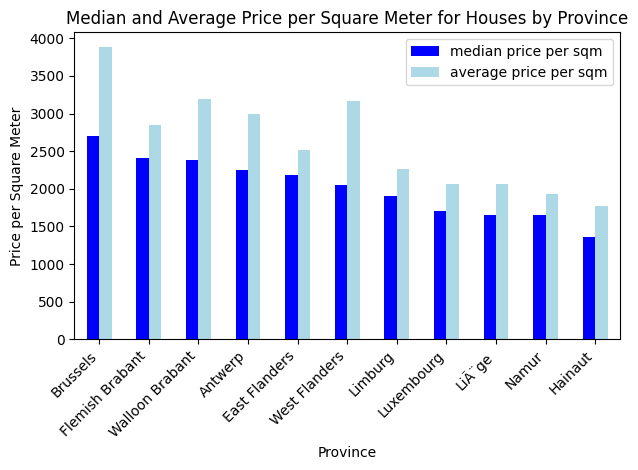

<Figure size 1200x600 with 0 Axes>

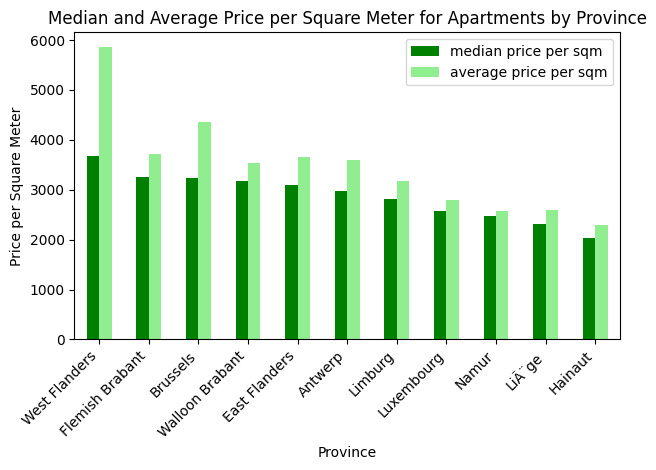

In [ ]:
# Load the final clean dataset
final_clean_data = 'final_clean/row_data_20240304_clean.csv'
df_cleaned = pd.read_csv(final_clean_data)

# Filter the DataFrame into houses and apartments
houses_df = df_cleaned[df_cleaned['type'] == 'HOUSE']
apartments_df = df_cleaned[df_cleaned['type'] == 'APARTMENT']

# Group by province and calculate the median and average price per square meter for houses
houses_price_per_sqm_by_province = houses_df.groupby('province').agg({'price_main': 'median', 'surface': 'median'})
houses_price_per_sqm_by_province['median price per sqm'] = houses_price_per_sqm_by_province['price_main'] / houses_price_per_sqm_by_province['surface']
houses_price_per_sqm_by_province['average price per sqm'] = houses_df.groupby('province')['price_main'].mean() / houses_price_per_sqm_by_province['surface']
houses_price_per_sqm_by_province = houses_price_per_sqm_by_province[['median price per sqm', 'average price per sqm']].sort_values(by='median price per sqm', ascending=False)

# Group by province and calculate the median and average price per square meter for apartments
apartments_price_per_sqm_by_province = apartments_df.groupby('province').agg({'price_main': 'median', 'surface': 'median'})
apartments_price_per_sqm_by_province['median price per sqm'] = apartments_price_per_sqm_by_province['price_main'] / apartments_price_per_sqm_by_province['surface']
apartments_price_per_sqm_by_province['average price per sqm'] = apartments_df.groupby('province')['price_main'].mean() / apartments_price_per_sqm_by_province['surface']
apartments_price_per_sqm_by_province = apartments_price_per_sqm_by_province[['median price per sqm', 'average price per sqm']].sort_values(by='median price per sqm', ascending=False)

# Plot histogram for houses
plt.figure(figsize=(12, 6))
houses_price_per_sqm_by_province.plot(kind='bar', color=['Blue', 'LightBlue'])
plt.title('Median and Average Price per Square Meter for Houses by Province')
plt.xlabel('Province')
plt.ylabel('Price per Square Meter')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('plotly_plots/house_price_sqm_province.png')  
plt.show()

# Plot histogram for apartments
plt.figure(figsize=(12, 6))
apartments_price_per_sqm_by_province.plot(kind='bar', color=['Green', 'LightGreen'])
plt.title('Median and Average Price per Square Meter for Apartments by Province')
plt.xlabel('Province')
plt.ylabel('Price per Square Meter')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('plotly_plots/apartment_price_sqm_province.png')  
plt.show()


### Distribution of Average Price per Square Meter for Houses and Apartments

In [ ]:
def plot_and_save_histogram(data, title, filename, surface_filter=None, color='skyblue'):
    if surface_filter:
        filtered_data = data[data <= surface_filter]
        filtered_title = f"{title} (Surface <= {surface_filter})"
    else:
        filtered_data = data
        filtered_title = title
    
    fig = go.Figure()
    fig.add_trace(go.Histogram(x=filtered_data, name='Data', marker_color=color))
    fig.update_layout(title=filtered_title, xaxis_title='Value', yaxis_title='Frequency')

    # Calculate mean and median
    mean_value = filtered_data.mean()
    median_value = filtered_data.median()

    # Add mean and median annotations with white text color
    fig.add_annotation(x=mean_value, y=0, text=f'Mean: {mean_value:.2f}', showarrow=True, arrowhead=1, ax=0, ay=-40, font=dict(color="white"))
    fig.add_annotation(x=median_value, y=0, text=f'Median: {median_value}', showarrow=True, arrowhead=1, ax=0, ay=-60, font=dict(color="white"))

    # Display the histogram in the notebook
    fig.show()

# Calculate average price per square meter for houses
houses_df_copy = houses_df.copy()
houses_df_copy['avg_price_per_sqm'] = houses_df_copy['price_main'] / houses_df_copy['surface']

# Calculate average price per square meter for apartments
apartments_df_copy = apartments_df.copy()
apartments_df_copy['avg_price_per_sqm'] = apartments_df_copy['price_main'] / apartments_df_copy['surface']

# Plot histogram for houses with a surface filter of 1000
plot_and_save_histogram(houses_df_copy['avg_price_per_sqm'], "Distribution of Average Price per Square Meter for Houses",
                         "avg_price_per_sqm_distribution_houses.html", surface_filter=10000, color='Blue')

# Plot histogram for apartments with a surface filter of 500
plot_and_save_histogram(apartments_df_copy['avg_price_per_sqm'], "Distribution of Average Price per Square Meter for Apartments",
                         "avg_price_per_sqm_distribution_apartments.html", surface_filter=2000, color='Green')


### Distribution of Average Price per square meter for houses by size

In [ ]:
# Load the final clean dataset with specified encoding
final_clean_data = 'final_clean/row_data_20240304_clean.csv'
df_cleaned = pd.read_csv(final_clean_data, encoding='latin1')

# Filter the DataFrame for houses and apartments
houses_df = df_cleaned[(df_cleaned['type'] == 'HOUSE') & (df_cleaned['surface'] >= 20)].copy()
apartments_df = df_cleaned[(df_cleaned['type'] == 'APARTMENT') & (df_cleaned['surface'] >= 10)].copy()

# Calculate price per square meter for houses and apartments
houses_df['price_per_sqm'] = houses_df['price_main'] / houses_df['surface']
apartments_df['price_per_sqm'] = apartments_df['price_main'] / apartments_df['surface']

# Group by size and calculate average price per square meter
avg_price_per_sqm_by_size_houses = houses_df.groupby('surface')['price_per_sqm'].mean().reset_index()
avg_price_per_sqm_by_size_apartments = apartments_df.groupby('surface')['price_per_sqm'].mean().reset_index()

house_surface = 1000
apartment_surface = 300

# Limit the x-axis to 300 square meters
avg_price_per_sqm_by_size_houses = avg_price_per_sqm_by_size_houses[avg_price_per_sqm_by_size_houses['surface'] <= house_surface]
avg_price_per_sqm_by_size_apartments = avg_price_per_sqm_by_size_apartments[avg_price_per_sqm_by_size_apartments['surface'] <= apartment_surface]

# Plot the scatter plots for houses and apartments
fig_houses = px.scatter(avg_price_per_sqm_by_size_houses, x='surface', y='price_per_sqm', 
                         title=(f"Average Price per Square Meter for Houses by Size (Up to {house_surface}m²)"), 
                         labels={'surface': 'Size (m²)', 'price_per_sqm': 'Price per Square Meter'},
                         color_discrete_sequence=['Blue'])
fig_apartments = px.scatter(avg_price_per_sqm_by_size_apartments, x='surface', y='price_per_sqm', 
                            title=(f"Average Price per Square Meter for Apartments by Size (Up to {apartment_surface}m²)"), 
                            labels={'surface': 'Size (m²)', 'price_per_sqm': 'Price per Square Meter'},
                            color_discrete_sequence=['Green'])

# Display the plots in the notebook
fig_houses.show()
fig_apartments.show()


### Is there a correlation between price per square meter for houses and apartments and Mobiscore.

data from https://mobiscore.omgeving.vlaanderen.be/

In [ ]:
import pandas as pd
import plotly.graph_objects as go

# Load the merged data
merged_data = pd.read_excel('final_clean/merged_mobi_data.xlsx')

# Calculate average price per square meter
merged_data['avg_price_per_sqm'] = merged_data['price_main'] / merged_data['surface']

# Calculate correlation between 'score' and average price per square meter
correlation = merged_data['score'].corr(merged_data['avg_price_per_sqm'])

print("Correlation between 'score' and average price per square meter:", correlation)

# Plot the correlation
fig = go.Figure()
fig.add_trace(go.Scatter(x=merged_data['score'], y=merged_data['avg_price_per_sqm'], mode='markers', marker=dict(color='blue')))
fig.update_layout(title='Correlation between Score and Average Price per Square Meter',
                  xaxis_title='Score',
                  yaxis_title='Average Price per Square Meter')

fig.show()


Correlation between 'score' and average price per square meter: 0.14091881921325655
